## Data Preprocessing, Preparation and Model Implementation

In [1]:
import numpy as np
import pandas as pd
import os
import random
import cv2
import matplotlib.pyplot as plt
#import spell_corrector as sc
import math
from PIL import Image, ImageDraw
from PIL import ImagePath
import pandas as pd
import os
from os import path
from tqdm import tqdm
import json
import pathlib
import urllib
import glob
import re
import tensorflow as tf
import csv
import sys
import cv2
import time
import argparse
import itertools
from multiprocessing import Pool
import threading
import numpy as np
import scipy.optimize
import matplotlib.pyplot as plt
import matplotlib.patches as Patches
from shapely.geometry import Polygon

import tensorflow as tf

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_root = '/content/drive/MyDrive/DeepLearning_Models/EAST/Data'
def return_file_names_df(root_dir,X):
    arr = os.listdir(root_dir)
    col =[]
    for i in arr:
      if i == X or i == X+'_gt':

        dir_path = str(root_dir)+'/'+ i
        data_root= pathlib.Path(dir_path)
        li= list(sorted(data_root.glob('*.*')))
        li = [str(path) for path in li]
        col.append(li)
    data_df = pd.DataFrame()
    data_df['path_img'] = col[0]
    data_df['path_gt'] = col[1]
    return data_df

df_train = return_file_names_df(data_root,'train')
df_train.head()

#test dataframe
df_test = return_file_names_df(data_root,'test')
df_test.head()

,path_img,path_gt
0,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
1,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
2,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
3,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
4,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...


In [ ]:
# df_train = pd.read_pickle("df_train.pkl")
# df_test = pd.read_pickle("df_test.pkl")

In [4]:
df_train.head()

,path_img,path_gt
0,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
1,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
2,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
3,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...
4,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...


# 1. Methods for text detection & recognition before the Deep Learning Era

### 1.1 MSER(Maximally Stable Extremal Regions)

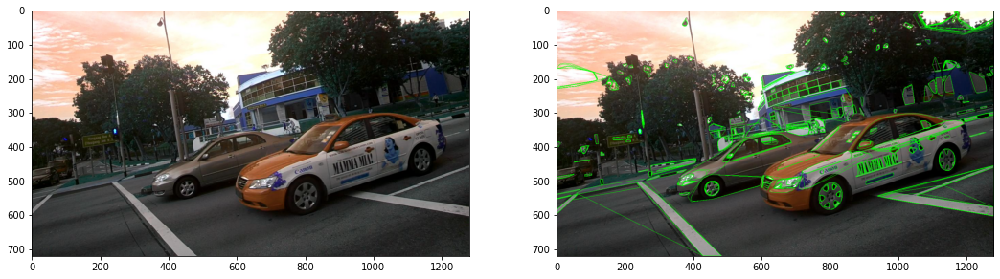

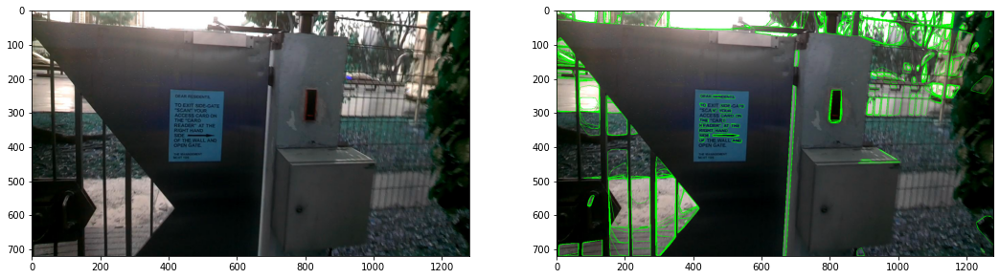

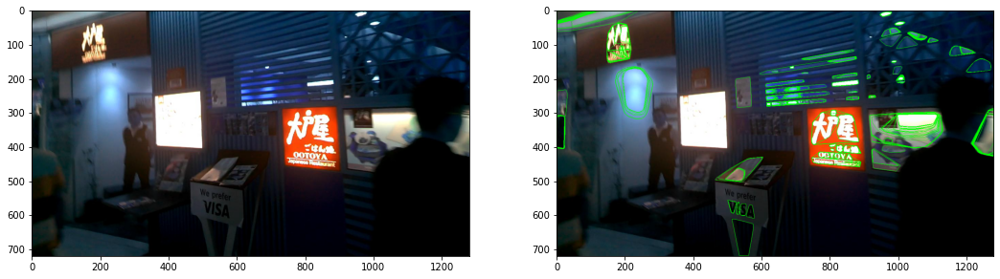

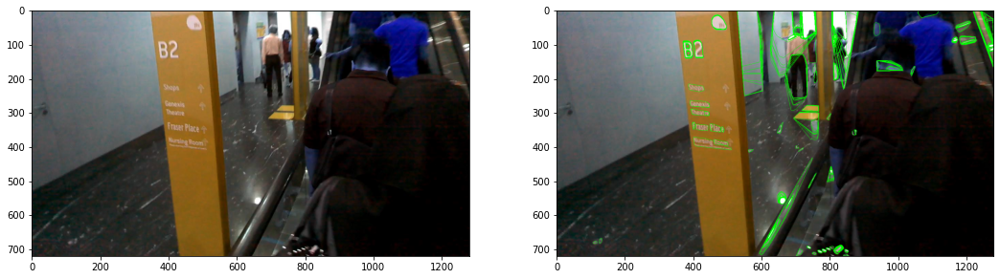

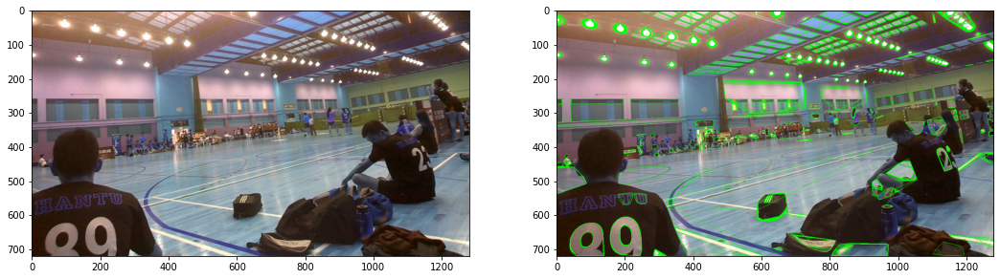

In [ ]:
#Create MSER object

for i in range(10,15):

  filepath = df_train['path_img'][i]

  img_array = cv2.imread(filepath)

  plt.figure(figsize=(18,8))
  plt.subplot(1,2,1)
  plt.grid(False)   
  plt.imshow(img_array)

  plt.subplot(1,2,2)
  mser = cv2.MSER_create()

  #Reading image
  img = cv2.imread(df_train['path_img'].values[i])

  #Convert to gray scale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  #Detect regions in gray scale image
  regions, _ = mser.detectRegions(gray)

  #Hulls for each dtected regions
  hulls = [cv2.convexHull(p.reshape(-1, 1, 2)) for p in regions]

  #Drawing polylines on image
  cv2.polylines(img, hulls, 1, (0, 255, 0))

  #Showing image with polylines on detected text in an image
  plt.grid(False)
  plt.imshow(img)

##1.2 SWT(Stroke Width Transform)

In [ ]:
#https://stackoverflow.com/questions/11116199/stroke-width-transform-swt-implementation-python
from swtloc import SWTLocalizer
from swtloc.utils import imgshowN, imgshow

swtl = SWTLocalizer()
imgpaths = ... # Image paths, can be one image or more than one
swtl.swttransform(imgpaths=df_train['path_img'][13], save_results=True, save_rootpath='swtres/',
                  edge_func = 'ac', ac_sigma = 1.0, text_mode = 'db_lf',
                  gs_blurr=True, blurr_kernel = (5,5), minrsw = 3, 
                  maxCC_comppx = 10000, maxrsw = 200, max_angledev = np.pi/6, 
                  acceptCC_aspectratio = 5.0)

MainProcess @  |                COMPLETE                 | -> STATUS: 0.0% 1/1 Images Done. Transformations Complete



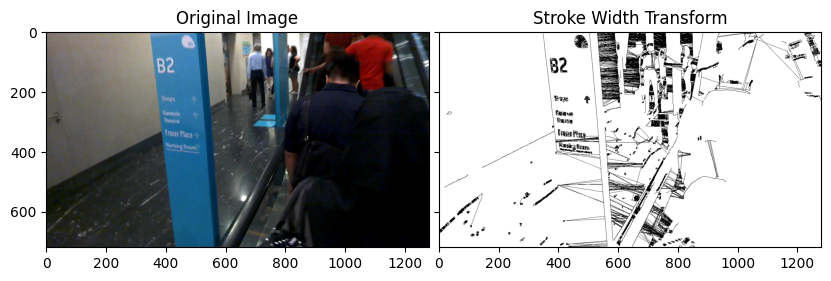

In [ ]:
imgshowN([swtl.orig_img, swtl.swt_mat], ['Original Image', 'Stroke Width Transform'])

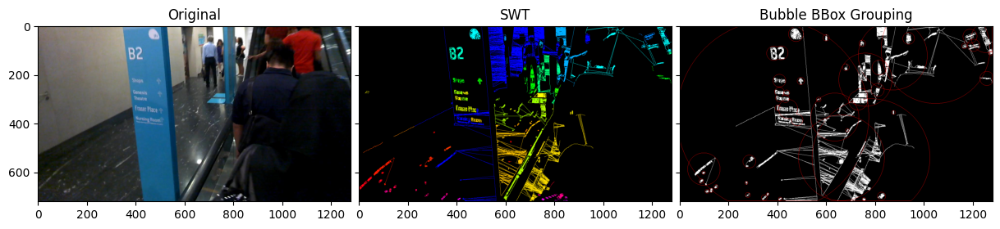

In [ ]:
respacket = swtl.get_grouped(lookup_radii_multiplier=1, sw_ratio=2,
                             cl_deviat=[13,13,13], ht_ratio=2, 
                             ar_ratio=3, ang_deviat=30)

grouped_labels = respacket[0]
grouped_bubblebbox = respacket[1]
grouped_annot_bubble = respacket[2]
grouped_annot = respacket[3]
maskviz = respacket[4]
maskcomb  = respacket[5]

imgshowN([swtl.orig_img, swtl.swt_labelled3C, grouped_annot_bubble],
         ['Original', 'SWT','Bubble BBox Grouping'],figsize=(15,8))

## 2.1 **EAST** (**E**fficient **A**ccurate **S**cene **T**ext Detector)

#### Paper-https://arxiv.org/pdf/1704.03155.pdf

#### Blog-https://www.programmersought.com/article/1293848303/

#### Github(Implementation)-https://github.com/kurapan/EAST

#### It is fast and accurate scene text detection method and consists of two stages: 

#### (1) It uses a complete convolutional network (FCN) model to directly generate pixel-based word or text line predictions

#### (2) After generating text predictions ( Rotate a rectangle or quad) and the output is sent to the non-maximum suppression to produce the final result.

#### The pipeline is shown below:

### Model Pipeline -

<img src="https://i.ibb.co/vzrfYYk/pipeline.jpg" alt="pipeline" border="0">

### Network Architecture-(with PVANet)

#### PVANet- It is lightweight feature extraction network architecture for object detection,which achieves real-time object detection performance without losing accuracy.

#### Model can be divided into three parts: Stem feature extraction, feature merging branches and output layer.

<img src="https://i.ibb.co/DD70JdN/case2.png" alt="case2" border="0">

### 1. Feature Extractor (PVANet)
<img src="https://i.ibb.co/crHLYBk/feat-ext.png" alt="feat-ext" border="0">

 #### This part can be any convolutional neural network with convolutional layer and pooled layer interleaving pre-trained on Imagenet data for examples PVANet,VGG16 and RESNET50.From this network,four levels of feature maps f1, f2, f3 and f4 can be obtained.Because we are extracting features it is called as Feature Extractor.

 ### 2. Feature Merging Branch 
 <img src="https://i.ibb.co/YNVLRNX/feat-merge.png" alt="feat-merge" border="0">

 #### In this part,the feature maps obtained from the feature extractor are first fed to the unpooling layer to double its size, and then concatenated  ​​with the current feature map in each merging state. Next, the 1X1 convolution  is used where the conv bottleneck reduced the number of channels and reduced the amount of calculation also , followed by a 3X3 convolution to fuse information to produce the final output of every merging stage as shown in the fig.
#### The calculation process of g and h for each is shown in the figure below:




<img src="https://images1.programmersought.com/61/36/368d652ae9752868f4a670b386deee6d.png" alt="8a8db9ed453e84407bd1afaacc2070ba" border="0">

#### gi is an intermediate state and the basis of merging
#### hi is the merged feature map

 ### 3. Output Layer 
 #### The final output from the merged state is passed through 1X1 Conv layer with 1 channel which gives a score map ranging from[0-1] .The final output is also passed through RBOX or QUAD Geometry (description about these are shown in the below fig) which gives a multi-channel geometry map.

<img src=" https://images4.programmersought.com/769/60/6082b3da1d7f28faa6fa666e3d583541.png" alt="geo_map" border="0">

The details about score map and geometry map will disscussed while implementation.

#**Implementation**

In [5]:
listFiles = list(df_train['path_img'])

In [6]:
#vocabulary creation
l=list(df_train['path_gt'])
CLASSES=[]
for i in tqdm(l):
    file=open(i)
    for line in file:
        line=line.replace('\n','')
        a=line.split(",")[-1]
        if a!='':
            CLASSES.append(a)
NUM_CLASSES=len(list(set(CLASSES)))      

100%|██████████| 1000/1000 [04:27<00:00,  3.73it/s]


In [7]:
NUM_CLASSES

2683



## Step-1- Data Preparation & Data Generation( DATA PIPELINE )

<img src="https://i.ibb.co/nc4BJrd/stp1.png" alt="stp1" border="0">

#### In this step we have to do data preparation  and also have to build generator function which will give Image array(Input of the model) with score map(output) and geo-map(output) as you can observe in the above figure the output from the Multichannel FCN along with training mask.

### **Score Map**:

#### It represents the confidence score/level for the predicted geometry map at that location.It lies in the range[0,1].Lets understand it by an example:
#### lets say 0.80 is score map of a pixel ,this simply means that for this pixel we are 80% confident that it will have the predicted geometry map or we can say that it is 80% chance that thi pixel is part of predicted text region. 

### **Geo Map**:

#### As we know  along with score map ,we also obtain a multi-channel geometric information map as an output. The geometric output can be RBOX or QUAD.


<img src=" https://images4.programmersought.com/769/60/6082b3da1d7f28faa6fa666e3d583541.png" alt="geo_map" border="0">

#### The number of channels along with the functions for AABB, RBOX and QUAD  are shown in the above table.

#### RBOX:

<img src="https://i.ibb.co/P5LD6yc/RBOX.jpg" alt="RBOX" border="0">

#### From the above image we can observe that For RBOX, the geometry uses a four-channel axis-aligned bounding box (AABB) R and a channel rotation angle θ . The formula of R is G. The four channels represent 4 distances, which are the distance from the pixel position to the rectangular boundaries and  one channel for rotation angle as shown below.
<img src="https://i.ibb.co/SxvWXwB/rbox.png" alt="rbox" border="0">

#### QUAD:
<img src="https://i.ibb.co/R4qN9xZ/quad.jpg" alt="quad" border="0">

#### For QUAD , we use 8 numbers to represent the coordinate displacement from four vertices to each pixel location. Each offset distance contains Δxi | Δyi two numbers and the geometric output contains 8 channels.An example is shown below

<img src="https://i.ibb.co/71cqXnn/pix.jpg" alt="pix" border="0">






#### *Note: In this implementation only RBOX is used.*






<img src="https://i.ibb.co/XxVCKD2/smap.png" alt="smap" border="0">

<img src="https://i.ibb.co/MRKRY7h/gmap.png" alt="gmap" border="0">

### Code Sources - 
#### https://github.com/kurapan/EAST
#### https://github.com/Pay20Y/FOTS_TF
#### https://github.com/yu20103983/FOTS
#### https://github.com/Masao-Taketani/FOTS_OCR

In [8]:

# https://github.com/Masao-Taketani/FOTS_OCR
def load_annoataion(p):
    '''
    load polygon coordinate and text from the text file for corresponding image
    here p is name of image file whose cooresponding annotation we want 
    '''
    text_polys = []
    text_tags = []
    if not os.path.exists(p):
        return np.array(text_polys, dtype=np.float32), np.array(text_tags, dtype=np.int32)
    with open(p, 'r') as f:
        reader = csv.reader(f)
        for line in reader:
            label = line[-1].replace(' ','')
            line = [i.strip('\ufeff').strip('\xef\xbb\xbf') for i in line]

            x1, y1, x2, y2, x3, y3, x4, y4 = list(map(float, line[:8]))
            text_polys.append([[x1, y1], [x2, y2], [x3, y3], [x4, y4]])
            
            if label == '###':
                text_tags.append(None)
            else:
                text_tags.append(label)

        return np.array(text_polys, dtype=np.float32), text_tags   

In [9]:
def polygon_area(poly):
    '''
    compute area of a polygon
    '''
    edge = [
        (poly[1][0] - poly[0][0]) * (poly[1][1] + poly[0][1]),
        (poly[2][0] - poly[1][0]) * (poly[2][1] + poly[1][1]),
        (poly[3][0] - poly[2][0]) * (poly[3][1] + poly[2][1]),
        (poly[0][0] - poly[3][0]) * (poly[0][1] + poly[3][1])
    ]
    return np.sum(edge)/2.

In [10]:
#3
# This function is used to discard invalid polygons and check direction of them
# https://github.com/Masao-Taketani/FOTS_OCR

def check_and_validate_polys(polys, tags, xxx_todo_changeme):
  '''
  check so that the text poly is in the same direction,
  and also filter some invalid polygons
  :param polys:
  :param tags:
  :return:
  '''
  (h, w) = xxx_todo_changeme
  if polys.shape[0] == 0:
    return polys
  polys[:, :, 0] = np.clip(polys[:, :, 0], 0, w-1)
  polys[:, :, 1] = np.clip(polys[:, :, 1], 0, h-1)

  validated_polys = []
  validated_tags = []
  for poly, tag in zip(polys, tags):
    p_area = polygon_area(poly)
    if abs(p_area) < 1:
      print('invalid poly')
      continue
    if p_area > 0:
      #if not FLAGS.suppress_warnings_and_error_messages:
      print('poly in wrong direction')
      poly = poly[(0, 3, 2, 1), :]
    validated_polys.append(poly)
    validated_tags.append(tag)
  return np.array(validated_polys), validated_tags


In [11]:
#This function is implementation of Polygon Shrinkage Algorithm 

def shrink_poly(poly, r):
    '''
    fit a poly inside the origin poly
    used for generate the score map
    '''
    # shrink ratio
    R = 0.3
    # find the longer pair
    if np.linalg.norm(poly[0] - poly[1]) + np.linalg.norm(poly[2] - poly[3]) > \
                    np.linalg.norm(poly[0] - poly[3]) + np.linalg.norm(poly[1] - poly[2]):
        # first move (p0, p1), (p2, p3), then (p0, p3), (p1, p2)
        ## p0, p1
        theta = np.arctan2((poly[1][1] - poly[0][1]), (poly[1][0] - poly[0][0]))
        poly[0][0] += R * r[0] * np.cos(theta)
        poly[0][1] += R * r[0] * np.sin(theta)
        poly[1][0] -= R * r[1] * np.cos(theta)
        poly[1][1] -= R * r[1] * np.sin(theta)
        ## p2, p3
        theta = np.arctan2((poly[2][1] - poly[3][1]), (poly[2][0] - poly[3][0]))
        poly[3][0] += R * r[3] * np.cos(theta)
        poly[3][1] += R * r[3] * np.sin(theta)
        poly[2][0] -= R * r[2] * np.cos(theta)
        poly[2][1] -= R * r[2] * np.sin(theta)
        ## p0, p3
        theta = np.arctan2((poly[3][0] - poly[0][0]), (poly[3][1] - poly[0][1]))
        poly[0][0] += R * r[0] * np.sin(theta)
        poly[0][1] += R * r[0] * np.cos(theta)
        poly[3][0] -= R * r[3] * np.sin(theta)
        poly[3][1] -= R * r[3] * np.cos(theta)
        ## p1, p2
        theta = np.arctan2((poly[2][0] - poly[1][0]), (poly[2][1] - poly[1][1]))
        poly[1][0] += R * r[1] * np.sin(theta)
        poly[1][1] += R * r[1] * np.cos(theta)
        poly[2][0] -= R * r[2] * np.sin(theta)
        poly[2][1] -= R * r[2] * np.cos(theta)
    else:
        ## p0, p3
        # print poly
        theta = np.arctan2((poly[3][0] - poly[0][0]), (poly[3][1] - poly[0][1]))
        poly[0][0] += R * r[0] * np.sin(theta)
        poly[0][1] += R * r[0] * np.cos(theta)
        poly[3][0] -= R * r[3] * np.sin(theta)
        poly[3][1] -= R * r[3] * np.cos(theta)
        ## p1, p2
        theta = np.arctan2((poly[2][0] - poly[1][0]), (poly[2][1] - poly[1][1]))
        poly[1][0] += R * r[1] * np.sin(theta)
        poly[1][1] += R * r[1] * np.cos(theta)
        poly[2][0] -= R * r[2] * np.sin(theta)
        poly[2][1] -= R * r[2] * np.cos(theta)
        ## p0, p1
        theta = np.arctan2((poly[1][1] - poly[0][1]), (poly[1][0] - poly[0][0]))
        poly[0][0] += R * r[0] * np.cos(theta)
        poly[0][1] += R * r[0] * np.sin(theta)
        poly[1][0] -= R * r[1] * np.cos(theta)
        poly[1][1] -= R * r[1] * np.sin(theta)
        ## p2, p3
        theta = np.arctan2((poly[2][1] - poly[3][1]), (poly[2][0] - poly[3][0]))
        poly[3][0] += R * r[3] * np.cos(theta)
        poly[3][1] += R * r[3] * np.sin(theta)
        poly[2][0] -= R * r[2] * np.cos(theta)
        poly[2][1] -= R * r[2] * np.sin(theta)
    return poly


    


In [12]:
def point_dist_to_line(p1, p2, p3):
    '''compute the distance from p3 to p1-p2'''
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)

#Find equation of line using two 2D points p1 and p2
def fit_line(p1, p2):
    '''fit a line ax+by+c = 0'''
    if p1[0] == p1[1]:
        return [1., 0., -p1[0]]
    else:
        [k, b] = np.polyfit(p1, p2, deg=1)
        return [k, -1., b]

In [13]:
#Find Intersection poitn of 2 lines
def line_cross_point(line1, line2):
    '''line1 0= ax+by+c, compute the cross point of line1 and line2'''
    if line1[0] != 0 and line1[0] == line2[0]:
        print('Cross point does not exist')
        return None
    if line1[0] == 0 and line2[0] == 0:
        print('Cross point does not exist')
        return None
    if line1[1] == 0:
        x = -line1[2]
        y = line2[0] * x + line2[2]
    elif line2[1] == 0:
        x = -line2[2]
        y = line1[0] * x + line1[2]
    else:
        k1, _, b1 = line1
        k2, _, b2 = line2
        x = -(b1-b2)/(k1-k2)
        y = k1*x + b1
    return np.array([x, y], dtype=np.float32)

In [14]:
def line_verticle(line, point):
    '''get the verticle line from line across point'''
    if line[1] == 0:
        verticle = [0, -1, point[1]]
    else:
        if line[0] == 0:
            verticle = [1, 0, -point[0]]
        else:
            verticle = [-1./line[0], -1, point[1] - (-1/line[0] * point[0])]
    return verticle

In [15]:
# Convert a parallelogram to rectangle
# https://github.com/Masao-Taketani/FOTS_OCR
def rectangle_from_parallelogram(poly):
    '''
    fit a rectangle from a parallelogram
    '''
    p0, p1, p2, p3 = poly
    angle_p0 = np.arccos(np.dot(p1-p0, p3-p0)/(np.linalg.norm(p0-p1) * np.linalg.norm(p3-p0)))
    if angle_p0 < 0.5 * np.pi:
        if np.linalg.norm(p0 - p1) > np.linalg.norm(p0-p3):
            # p0 and p2
            ## p0
            p2p3 = fit_line([p2[0], p3[0]], [p2[1], p3[1]])
            p2p3_verticle = line_verticle(p2p3, p0)

            new_p3 = line_cross_point(p2p3, p2p3_verticle)
            ## p2
            p0p1 = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            p0p1_verticle = line_verticle(p0p1, p2)

            new_p1 = line_cross_point(p0p1, p0p1_verticle)
            return np.array([p0, new_p1, p2, new_p3], dtype=np.float32)
        else:
            p1p2 = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            p1p2_verticle = line_verticle(p1p2, p0)

            new_p1 = line_cross_point(p1p2, p1p2_verticle)
            p0p3 = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            p0p3_verticle = line_verticle(p0p3, p2)

            new_p3 = line_cross_point(p0p3, p0p3_verticle)
            return np.array([p0, new_p1, p2, new_p3], dtype=np.float32)
    else:
        if np.linalg.norm(p0-p1) > np.linalg.norm(p0-p3):
            # p1 and p3
            ## p1
            p2p3 = fit_line([p2[0], p3[0]], [p2[1], p3[1]])
            p2p3_verticle = line_verticle(p2p3, p1)

            new_p2 = line_cross_point(p2p3, p2p3_verticle)
            ## p3
            p0p1 = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            p0p1_verticle = line_verticle(p0p1, p3)

            new_p0 = line_cross_point(p0p1, p0p1_verticle)
            return np.array([new_p0, p1, new_p2, p3], dtype=np.float32)
        else:
            p0p3 = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            p0p3_verticle = line_verticle(p0p3, p1)

            new_p0 = line_cross_point(p0p3, p0p3_verticle)
            p1p2 = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            p1p2_verticle = line_verticle(p1p2, p3)

            new_p2 = line_cross_point(p1p2, p1p2_verticle)
            return np.array([new_p0, p1, new_p2, p3], dtype=np.float32)

In [16]:
#Sorting a rectangle to get all point in clockwies manner
def sort_rectangle(poly):
    '''sort the four coordinates of the polygon, points in poly should be sorted clockwise'''
    # First find the lowest point
    p_lowest = np.argmax(poly[:, 1])
    if np.count_nonzero(poly[:, 1] == poly[p_lowest, 1]) == 2:
        # if the bottom line is parallel to x-axis, then p0 must be the upper-left corner
        p0_index = np.argmin(np.sum(poly, axis=1))
        p1_index = (p0_index + 1) % 4
        p2_index = (p0_index + 2) % 4
        p3_index = (p0_index + 3) % 4
        return poly[[p0_index, p1_index, p2_index, p3_index]], 0.
    else:
        # find the point that sits right to the lowest point
        p_lowest_right = (p_lowest - 1) % 4
        p_lowest_left = (p_lowest + 1) % 4
        angle = np.arctan(-(poly[p_lowest][1] - poly[p_lowest_right][1])/(poly[p_lowest][0] - poly[p_lowest_right][0]))
        # assert angle > 0
        if angle <= 0:
            print(angle, poly[p_lowest], poly[p_lowest_right])
        if angle/np.pi * 180 > 45:
            #this point is p2
            p2_index = p_lowest
            p1_index = (p2_index - 1) % 4
            p0_index = (p2_index - 2) % 4
            p3_index = (p2_index + 1) % 4
            return poly[[p0_index, p1_index, p2_index, p3_index]], -(np.pi/2 - angle)
        else:
            # this point is p3
            p3_index = p_lowest
            p0_index = (p3_index + 1) % 4
            p1_index = (p3_index + 2) % 4
            p2_index = (p3_index + 3) % 4
            return poly[[p0_index, p1_index, p2_index, p3_index]], angle


In [17]:
# https://github.com/Masao-Taketani/FOTS_OCR
def restore_rectangle_rbox(origin, geometry):
    ''' Resotre rectangle tbox'''
    d = geometry[:, :4]
    angle = geometry[:, 4]
    # for angle > 0
    origin_0 = origin[angle >= 0]
    d_0 = d[angle >= 0]
    angle_0 = angle[angle >= 0]
    if origin_0.shape[0] > 0:
        p = np.array([np.zeros(d_0.shape[0]), -d_0[:, 0] - d_0[:, 2],
                      d_0[:, 1] + d_0[:, 3], -d_0[:, 0] - d_0[:, 2],
                      d_0[:, 1] + d_0[:, 3], np.zeros(d_0.shape[0]),
                      np.zeros(d_0.shape[0]), np.zeros(d_0.shape[0]),
                      d_0[:, 3], -d_0[:, 2]])
        p = p.transpose((1, 0)).reshape((-1, 5, 2))  # N*5*2

        rotate_matrix_x = np.array([np.cos(angle_0), np.sin(angle_0)]).transpose((1, 0))
        rotate_matrix_x = np.repeat(rotate_matrix_x, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))  # N*5*2

        rotate_matrix_y = np.array([-np.sin(angle_0), np.cos(angle_0)]).transpose((1, 0))
        rotate_matrix_y = np.repeat(rotate_matrix_y, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))

        p_rotate_x = np.sum(rotate_matrix_x * p, axis=2)[:, :, np.newaxis]  # N*5*1
        p_rotate_y = np.sum(rotate_matrix_y * p, axis=2)[:, :, np.newaxis]  # N*5*1

        p_rotate = np.concatenate([p_rotate_x, p_rotate_y], axis=2)  # N*5*2

        p3_in_origin = origin_0 - p_rotate[:, 4, :]
        new_p0 = p_rotate[:, 0, :] + p3_in_origin  # N*2
        new_p1 = p_rotate[:, 1, :] + p3_in_origin
        new_p2 = p_rotate[:, 2, :] + p3_in_origin
        new_p3 = p_rotate[:, 3, :] + p3_in_origin

        new_p_0 = np.concatenate([new_p0[:, np.newaxis, :], new_p1[:, np.newaxis, :],
                                  new_p2[:, np.newaxis, :], new_p3[:, np.newaxis, :]], axis=1)  # N*4*2
    else:
        new_p_0 = np.zeros((0, 4, 2))
    # for angle < 0
    origin_1 = origin[angle < 0]
    d_1 = d[angle < 0]
    angle_1 = angle[angle < 0]
    if origin_1.shape[0] > 0:
        p = np.array([-d_1[:, 1] - d_1[:, 3], -d_1[:, 0] - d_1[:, 2],
                      np.zeros(d_1.shape[0]), -d_1[:, 0] - d_1[:, 2],
                      np.zeros(d_1.shape[0]), np.zeros(d_1.shape[0]),
                      -d_1[:, 1] - d_1[:, 3], np.zeros(d_1.shape[0]),
                      -d_1[:, 1], -d_1[:, 2]])
        p = p.transpose((1, 0)).reshape((-1, 5, 2))  # N*5*2

        rotate_matrix_x = np.array([np.cos(-angle_1), -np.sin(-angle_1)]).transpose((1, 0))
        rotate_matrix_x = np.repeat(rotate_matrix_x, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))  # N*5*2

        rotate_matrix_y = np.array([np.sin(-angle_1), np.cos(-angle_1)]).transpose((1, 0))
        rotate_matrix_y = np.repeat(rotate_matrix_y, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))

        p_rotate_x = np.sum(rotate_matrix_x * p, axis=2)[:, :, np.newaxis]  # N*5*1
        p_rotate_y = np.sum(rotate_matrix_y * p, axis=2)[:, :, np.newaxis]  # N*5*1

        p_rotate = np.concatenate([p_rotate_x, p_rotate_y], axis=2)  # N*5*2

        p3_in_origin = origin_1 - p_rotate[:, 4, :]
        new_p0 = p_rotate[:, 0, :] + p3_in_origin  # N*2
        new_p1 = p_rotate[:, 1, :] + p3_in_origin
        new_p2 = p_rotate[:, 2, :] + p3_in_origin
        new_p3 = p_rotate[:, 3, :] + p3_in_origin

        new_p_1 = np.concatenate([new_p0[:, np.newaxis, :], new_p1[:, np.newaxis, :],
                                  new_p2[:, np.newaxis, :], new_p3[:, np.newaxis, :]], axis=1)  # N*4*2
    else:
        new_p_1 = np.zeros((0, 4, 2))
    return np.concatenate([new_p_0, new_p_1])

In [18]:

# https://github.com/Masao-Taketani/FOTS_OCR

#Some geometrical functions used in codes
def restore_rectangle(origin, geometry):
    return restore_rectangle_rbox(origin, geometry)

def getRotateRect(box):
    rect = cv2.minAreaRect(box)

    angle=rect[2]  # angle = [-90, 0)
    if angle < -45:
        rect = (rect[0], (rect[1][0], rect[1][1]), rect[2])
        angle += 90
        size = (rect[1][1],rect[1][0])
    else:
        rect = (rect[0], (rect[1][0], rect[1][1]), rect[2])
        size=rect[1]

    box_ = cv2.boxPoints(rect)
    return np.concatenate([rect[0], size]), angle, box_

In [19]:
# https://github.com/Pay20Y/FOTS_TF
# https://github.com/yu20103983/FOTS
# https://github.com/Masao-Taketani/FOTS_OCR
#These Functions are used to Generate ROI params like out box,crop box & angles that we use to crop text from image
def generate_roiRotatePara(box, angle, expand_w = 60):
    '''Generate all ROI Parameterts'''
    p0_rect, p1_rect, p2_rect, p3_rect = box
    cxy = (p0_rect + p2_rect) / 2.
    size = np.array([np.linalg.norm(p0_rect - p1_rect), np.linalg.norm(p0_rect - p3_rect)])
    rrect = np.concatenate([cxy, size])

    box=np.array(box)

    points=np.array(box, dtype=np.int32)
    xmin=np.min(points[:,0])
    xmax=np.max(points[:,0])
    ymin=np.min(points[:,1])
    ymax=np.max(points[:,1])
    bbox = np.array([xmin, ymin, xmax, ymax])
    if np.any(bbox < -expand_w):
        return None
    
    rrect[:2] -= bbox[:2]
    rrect[:2] -= rrect[2:] / 2
    rrect[2:] += rrect[:2]

    bbox[2:] -= bbox[:2]

    rrect[::2] = np.clip(rrect[::2], 0, bbox[2])
    rrect[1::2] = np.clip(rrect[1::2], 0, bbox[3])
    rrect[2:] -= rrect[:2]
    
    return bbox.astype(np.int32), rrect.astype(np.int32), - angle

def restore_roiRotatePara(box):
    rectange, rotate_angle = sort_rectangle(box)
    return generate_roiRotatePara(rectange, rotate_angle)


In [20]:
#This function is used to generate geo_map,score_map, training_mask,corp_box,out_box,angle that we use while training model

def generate_rbox(im_size, polys, tags):
    '''Genrate score_map and geo_map for image'''
    h, w = im_size
    poly_mask = np.zeros((h, w), dtype=np.uint8)
    score_map = np.zeros((h, w), dtype=np.uint8)
    geo_map = np.zeros((h, w, 5), dtype=np.float32)

    outBoxs = []
    cropBoxs = []
    angles = []
    text_tags = []
    recg_masks = []
    # mask used during traning, to ignore some hard areas
    training_mask = np.ones((h, w), dtype=np.uint8)
    for poly_idx, poly_tag in enumerate(zip(polys, tags)):
        poly = poly_tag[0]
        tag = poly_tag[1]

        r = [None, None, None, None]
        for i in range(4):
            r[i] = min(np.linalg.norm(poly[i] - poly[(i + 1) % 4]),
                       np.linalg.norm(poly[i] - poly[(i - 1) % 4]))
        # score map
        shrinked_poly = shrink_poly(poly.copy(), r).astype(np.int32)[np.newaxis, :, :]
        cv2.fillPoly(score_map, shrinked_poly, 1)
        cv2.fillPoly(poly_mask, shrinked_poly, poly_idx + 1)

        # if geometry == 'RBOX':
        # generate a parallelogram for any combination of two vertices
        fitted_parallelograms = []
        for i in range(4):
            p0 = poly[i]
            p1 = poly[(i + 1) % 4]
            p2 = poly[(i + 2) % 4]
            p3 = poly[(i + 3) % 4]
            edge = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            backward_edge = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            forward_edge = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            if point_dist_to_line(p0, p1, p2) > point_dist_to_line(p0, p1, p3):
                #  parallel lines through p2
                if edge[1] == 0:
                    edge_opposite = [1, 0, -p2[0]]
                else:
                    edge_opposite = [edge[0], -1, p2[1] - edge[0] * p2[0]]
            else:
                # after p3
                if edge[1] == 0:
                    edge_opposite = [1, 0, -p3[0]]
                else:
                    edge_opposite = [edge[0], -1, p3[1] - edge[0] * p3[0]]
            # move forward edge
            new_p0 = p0
            new_p1 = p1
            new_p2 = p2
            new_p3 = p3
            new_p2 = line_cross_point(forward_edge, edge_opposite)
            if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
                # across p0
                if forward_edge[1] == 0:
                    forward_opposite = [1, 0, -p0[0]]
                else:
                    forward_opposite = [forward_edge[0], -1, p0[1] - forward_edge[0] * p0[0]]
            else:
                # across p3
                if forward_edge[1] == 0:
                    forward_opposite = [1, 0, -p3[0]]
                else:
                    forward_opposite = [forward_edge[0], -1, p3[1] - forward_edge[0] * p3[0]]
            new_p0 = line_cross_point(forward_opposite, edge)
            new_p3 = line_cross_point(forward_opposite, edge_opposite)
            fitted_parallelograms.append([new_p0, new_p1, new_p2, new_p3, new_p0])
            # or move backward edge
            new_p0 = p0
            new_p1 = p1
            new_p2 = p2
            new_p3 = p3
            new_p3 = line_cross_point(backward_edge, edge_opposite)
            if point_dist_to_line(p0, p3, p1) > point_dist_to_line(p0, p3, p2):
                # across p1
                if backward_edge[1] == 0:
                    backward_opposite = [1, 0, -p1[0]]
                else:
                    backward_opposite = [backward_edge[0], -1, p1[1] - backward_edge[0] * p1[0]]
            else:
                # across p2
                if backward_edge[1] == 0:
                    backward_opposite = [1, 0, -p2[0]]
                else:
                    backward_opposite = [backward_edge[0], -1, p2[1] - backward_edge[0] * p2[0]]
            new_p1 = line_cross_point(backward_opposite, edge)
            new_p2 = line_cross_point(backward_opposite, edge_opposite)
            fitted_parallelograms.append([new_p0, new_p1, new_p2, new_p3, new_p0])
        areas = [Polygon(t).area for t in fitted_parallelograms]
        parallelogram = np.array(fitted_parallelograms[np.argmin(areas)][:-1], dtype=np.float32)
        # sort thie polygon
        parallelogram_coord_sum = np.sum(parallelogram, axis=1)
        min_coord_idx = np.argmin(parallelogram_coord_sum)
        parallelogram = parallelogram[
            [min_coord_idx, (min_coord_idx + 1) % 4, (min_coord_idx + 2) % 4, (min_coord_idx + 3) % 4]]

        rectange = rectangle_from_parallelogram(parallelogram)
        rectange, rotate_angle = sort_rectangle(rectange)

        p0_rect, p1_rect, p2_rect, p3_rect = rectange

        # if the poly is too small, then ignore it during training
        poly_h = min(np.linalg.norm(p0_rect - p3_rect), np.linalg.norm(p1_rect - p2_rect))
        poly_w = min(np.linalg.norm(p0_rect - p1_rect), np.linalg.norm(p2_rect - p3_rect))

        invaild = (min(poly_h, poly_w) < 6) or tag is None or (True and poly_h > poly_w * 2)

        if invaild:
            cv2.fillPoly(training_mask, poly.astype(np.int32)[np.newaxis, :, :], 0)
        xy_in_poly = np.argwhere(poly_mask == (poly_idx + 1))
        
        if not invaild:
            roiRotatePara = generate_roiRotatePara(rectange, rotate_angle)
            if roiRotatePara:
                outBox, cropBox, angle = roiRotatePara
                if min(cropBox[2:]) > 6:
                    w , h = cropBox[2:]
                    textImgW = np.ceil(min(w / float(h) * 32, 256) / 4 /1)
                    if textImgW >= 2 * min(len(tag), 16):  # avoid CTC error
                        outBoxs.append(outBox)
                        cropBoxs.append(cropBox)
                        angles.append(angle)
                        text_tags.append(tag[:16])
                        recg_masks.append(1.)

        for y, x in xy_in_poly:
            point = np.array([x, y], dtype=np.float32)
            # top
            geo_map[y, x, 0] = point_dist_to_line(p0_rect, p1_rect, point) + 3
            # right
            geo_map[y, x, 1] = point_dist_to_line(p1_rect, p2_rect, point) + 3
            # down
            geo_map[y, x, 2] = point_dist_to_line(p2_rect, p3_rect, point) + 3
            # left
            geo_map[y, x, 3] = point_dist_to_line(p3_rect, p0_rect, point) + 3
            # angle
            geo_map[y, x, 4] = rotate_angle
    if len(outBoxs) == 0:
        outBoxs.append([0, 0, 2 * 4, 2 * 4]) # keep extract From sharedConv feature map not zero
        cropBoxs.append([0, 0, 2 * 4, 2 * 4])
        angles.append(0.)
        text_tags.append([NUM_CLASSES - 2])
        recg_masks.append(0.)

    outBoxs = np.array(outBoxs, np.int32)
    cropBoxs = np.array(cropBoxs, np.int32)
    angles = np.array(angles, np.float32)

    return score_map, geo_map, training_mask, (outBoxs, cropBoxs, angles), text_tags, recg_masks

In [21]:
#Generator Function used to train Detection Branch in our Model
def generator(input_size=512, batch_size=32):
    '''Generator Function used fo training the model'''
    gt_list = df_train['path_gt'].values
    image_list = df_train['path_img'].values
    index = np.arange(0, image_list.shape[0])
    while True:
        np.random.shuffle(index)
        images = []
        image_fns = []
        score_maps = []
        geo_maps = []
        training_masks = []
        rboxes = []
        tags = []
        recg_masks = []
        for i in index:
            try:
                if image_list[i]==f'{data_root}/Data/train/img_141.jpg':
                  continue
                im_fn = image_list[i]
                
                im = cv2.imread(im_fn,cv2.IMREAD_UNCHANGED)
                
                # print im_fn
                h, w, _ = im.shape
               # txt_fn = im_fn
                text_polys, text_tags = load_annoataion(gt_list[i])
                text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))
                
                
                #resize the image to input size
                new_h, new_w, _ = im.shape
                resize_h = input_size
                resize_w = input_size
                im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)

                
                resize_ratio_3_x = resize_w/float(new_w)
                resize_ratio_3_y = resize_h/float(new_h)
                text_polys[:, :, 0] *= resize_ratio_3_x
                text_polys[:, :, 1] *= resize_ratio_3_y
                new_h, new_w, _ = im.shape
                score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

                

                images.append(im)
                image_fns.append(im_fn)
                score_maps.append(score_map[::, ::, np.newaxis].astype(np.float32))
                geo_maps.append(geo_map[::, ::, :].astype(np.float32))
                training_masks.append(training_mask[::, ::, np.newaxis].astype(np.float32))
                
                
                
                rboxes.append(rbox)
                tags.append(text_tags)
                recg_masks.append(recg_mask)

                if len(images) == batch_size:
                    yield (np.array(images),np.concatenate([np.array(score_maps), np.array(geo_maps), np.array(training_masks)],axis=3))
                    images = []
                    image_fns = []
                    score_maps = []
                    geo_maps = []
                    training_masks = []
                    rboxes = []
                    tags = []
                    recg_masks = []
            except Exception as e:
                print(image_list[i])
                import traceback
                traceback.print_exc()
                continue


Output Image of score map,geometry map and training task

In [22]:
# print im_fn
filepath = df_train['path_img'][94]
im = cv2.imread(filepath) 
h, w, _ = im.shape
# txt_fn = im_fn
text_polys, text_tags = load_annoataion(df_train['path_gt'][94])
text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))


#resize the image to input size
new_h, new_w, _ = im.shape
resize_h = 512
resize_w =512
im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)


resize_ratio_3_x = resize_w/float(new_w)
resize_ratio_3_y = resize_h/float(new_h)
text_polys[:, :, 0] *= resize_ratio_3_x
text_polys[:, :, 1] *= resize_ratio_3_y
new_h, new_w, _ = im.shape
score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

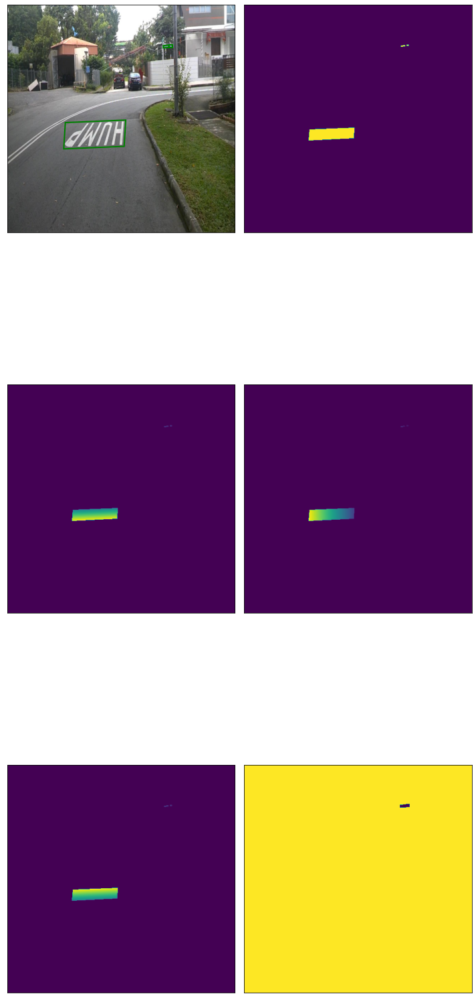

In [23]:
  fig, axs = plt.subplots(3, 2, figsize=(10, 26))
  axs[0, 0].imshow(im[:, :, ::-1])
  axs[0, 0].set_xticks([])
  axs[0, 0].set_yticks([])
  for poly in text_polys:
    poly_h = min(abs(poly[3, 1] - poly[0, 1]), abs(poly[2, 1] - poly[1, 1]))
    poly_w = min(abs(poly[1, 0] - poly[0, 0]), abs(poly[2, 0] - poly[3, 0]))
    axs[0, 0].add_artist(Patches.Polygon(
      poly, facecolor='none', edgecolor='green', linewidth=2, linestyle='-', fill=True))
    #axs[0, 0].text(poly[0, 0], poly[0, 1], '{:.0f}-{:.0f}'.format(poly_h, poly_w), color='purple')
  axs[0, 1].imshow(score_map[::, ::])
  axs[0, 1].set_xticks([])
  axs[0, 1].set_yticks([])
  axs[1, 0].imshow(geo_map[::, ::, 0])
  axs[1, 0].set_xticks([])
  axs[1, 0].set_yticks([])
  axs[1, 1].imshow(geo_map[::, ::, 1])
  axs[1, 1].set_xticks([])
  axs[1, 1].set_yticks([])
  axs[2, 0].imshow(geo_map[::, ::, 2])
  axs[2, 0].set_xticks([])
  axs[2, 0].set_yticks([])
  axs[2, 1].imshow(training_mask[::, ::])
  axs[2, 1].set_xticks([])
  axs[2, 1].set_yticks([])
  plt.tight_layout()
  plt.show()
  plt.close()

## Step -2 Model Building  & Loss Function
<img src="https://i.ibb.co/DwVdjq2/st2.png" alt="st2" border="0">

###Model-1(VGG16 as Fearure Extractor)

<img src="https://i.ibb.co/LrgX0zz/vgg.png" alt="vgg" border="0">

In [ ]:
vgg = tf.keras.applications.VGG16(input_shape=(512,512,3),include_top=False,weights='imagenet')
x = vgg.get_layer('block5_pool').output

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_1')(x)
x = tf.keras.layers.concatenate([x,vgg.get_layer('block4_pool').output], axis=3)
x = tf.keras.layers.Conv2D(256, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_2')(x)
x = tf.keras.layers.concatenate([x, vgg.get_layer('block3_pool').output], axis=3)
x = tf.keras.layers.Conv2D(128, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_3')(x)
x = tf.keras.layers.concatenate([x, vgg.get_layer('block2_pool').output], axis=3)
x = tf.keras.layers.Conv2D(64, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.Conv2D(32,kernel_size=3, strides=1,padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.UpSampling2D(size=(4,4),interpolation='bilinear',data_format='channels_last',name='extra')(x)


pred_score_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='pred_score_map',padding='same')(x)
rbox_geo_map = tf.keras.layers.Conv2D(4, (1, 1), activation=tf.nn.sigmoid, name='rbox_geo_map')(x)
rbox_geo_map = tf.keras.layers.Lambda(lambda x: x * 512)(rbox_geo_map)
angle_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='rbox_angle_map')(x)
angle_map = tf.keras.layers.Lambda(lambda x: (x - 0.5) * np.pi / 2)(angle_map)
output = tf.keras.layers.concatenate([pred_score_map,rbox_geo_map, angle_map], axis=3, name='pred_map')


model_vgg = tf.keras.models.Model(inputs=vgg.input, outputs= output,name='EAST')
for layers in vgg.layers:
  layers.trainable=False  

In [ ]:
model_vgg.summary()

Model: "EAST"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 512, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 512, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 256, 64) 0           block1_conv2[0][0]               
_______________________________________________________________________________________________

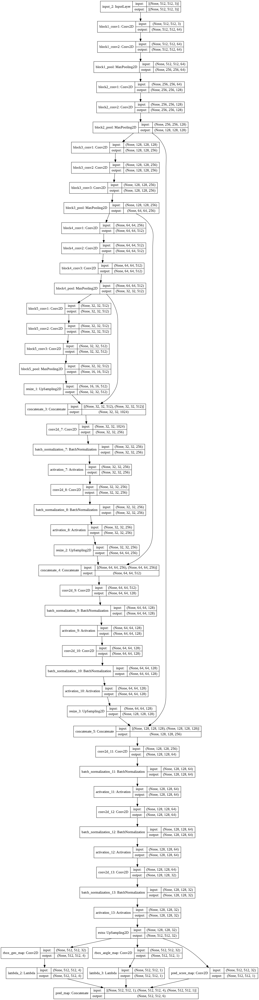

In [ ]:
tf.keras.utils.plot_model(model_vgg,show_shapes=True)

### Model-2(ResNet50 as Feature Extractor)

In [ ]:
resnet = tf.keras.applications.ResNet50(input_shape=(512, 512, 3), weights='imagenet', include_top=False)
tf.keras.backend.clear_session()
x = resnet.get_layer('conv5_block3_out').output

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_1')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv4_block6_out').output], axis=3)
x = tf.keras.layers.Conv2D(128, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_2')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv3_block4_out').output], axis=3)
x = tf.keras.layers.Conv2D(64, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_3')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv2_block3_out').output], axis=3)
x = tf.keras.layers.Conv2D(32, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)


pred_score_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='pred_score_map')(x)
rbox_geo_map = tf.keras.layers.Conv2D(4, (1, 1), activation=tf.nn.sigmoid, name='rbox_geo_map')(x)
angle_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='rbox_angle_map')(x)
angle_map = tf.keras.layers.Lambda(lambda x: (x - 0.5) * np.pi / 2)(angle_map)
output = tf.keras.layers.concatenate([pred_score_map,rbox_geo_map, angle_map], axis=3, name='pred_map')


model = tf.keras.models.Model(inputs=resnet.input, outputs= output,name='EAST')
for layers in resnet.layers:
  layers.trainable=False  

94773248/94765736 [==============================] - 1s 0us/step


In [ ]:
model.summary()

Model: "EAST"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 518, 518, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 256, 256, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 256, 256, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________________

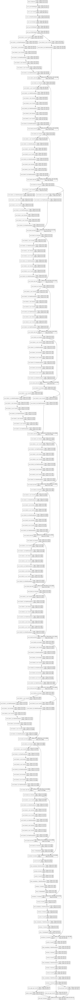

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

### Loss Function

#### The total loss is expressed as :


<img src="https://images4.programmersought.com/918/bb/bbb18887ab7197df2d418e0393fd9a7e.JPEG" alt="loss" border="0">

####Ls and Lg Represent the score graph and the geometric shape, λg Measure the importance of the two weights. In our experiment, we set λg Is 1.


### For Score Map Loss 
#### In the paper the loss used for score map is binary cross entropy loss with weighttage to both positive and negative class as shown in the fig. 

<img src="https://images1.programmersought.com/79/2b/2b85e4284bcc014a7c99f9b2a8e67d9f.JPEG" alt="loss" border="0">

#### But ,while implementation Dice Loss is used


### Geometry Map Loss
#### For RBOX ,the loss is defined as 


<img src="https://images1.programmersought.com/41/e2/e28a742672543af3390c23a9f07fcce1.JPEG" alt="loss" border="0">

#### The First loss is box loss and for this IOC loss is used as it invariant against objects of different scale.

<img src="https://images1.programmersought.com/139/71/71992ce2fb5f6a2c7cd84e1adf093af3.JPEG" alt="loss" border="0">

#### For rotation angle,the loss is given by 

<img src="https://images1.programmersought.com/219/63/6396f4cbb41fed7696d695ef08d57ecb.JPEG" alt="loss" border="0">





In [24]:
# This is dice coefficient loss used to classify point as text and non text region 
def dice_coefficient(y_true_cls, y_pred_cls,training_mask):
    '''
    dice loss
    :param y_true_cls:
    :param y_pred_cls:
    :param training_mask:x
    :return:
    '''
    eps = 10**-6
    intersection = tf.reduce_sum(y_true_cls * y_pred_cls * training_mask)
    
    union = tf.reduce_sum(y_true_cls * training_mask) + tf.reduce_sum(y_pred_cls * training_mask) + eps
    loss = 1. - (2 * intersection / union)
    return loss

def rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask):
  # d1 -> top, d2->right, d3->bottom, d4->left
  d1_gt, d2_gt, d3_gt, d4_gt, theta_gt = tf.split(value=y_true_geo, num_or_size_splits=5, axis=3)
  d1_pred, d2_pred, d3_pred, d4_pred, theta_pred = tf.split(value=y_pred_geo, num_or_size_splits=5, axis=3)

  area_gt = (d1_gt + d3_gt) * (d2_gt + d4_gt)
  area_pred = (d1_pred + d3_pred) * (d2_pred + d4_pred)
  w_union = tf.minimum(d2_gt, d2_pred) + tf.minimum(d4_gt, d4_pred)
  h_union = tf.minimum(d1_gt, d1_pred) + tf.minimum(d3_gt, d3_pred)
  area_intersect = w_union * h_union
  area_union = area_gt + area_pred - area_intersect

  L_AABB = -tf.math.log((area_intersect + 1.0) / (area_union + 1.0))
  L_theta = 1 - tf.cos(theta_pred - theta_gt)

  L_g = L_AABB +  50*L_theta
  L_g=tf.squeeze(L_g,axis=3)

  return tf.reduce_mean(L_g * y_true_cls * training_mask)

In [25]:
#This class contains complete loss we have used for text Detection Branch
class total_Loss(tf.keras.losses.Loss):
  def __init__(self, from_logits=False,reduction=tf.keras.losses.Reduction.AUTO,name='Loss_layer'):
      super(total_Loss, self).__init__(reduction=reduction, name=name)
  def call(self, y_true, y_pred):
    
    #Getting geo_map and score_maps
    y_true_cls=y_true[:,:,:,0]
    y_pred_cls=y_pred[:,:,:,0]
    y_pred_geo=y_pred[:,:,:,1:6]
    y_true_geo=y_true[:,:,:,1:6]
    training_mask=y_true[:,:,:,6]
    
    #1. Dice Loss
    dice_loss = dice_coefficient(y_true_cls, y_pred_cls, training_mask)
    # we scale classification loss by factor of 0.01 to match the iou loss part
    dice_loss *=0.01

    rbox_loss_ = rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask)
    
     
    return 100*(rbox_loss_ + dice_loss)




## Step-3 Model Training 

Model-1

In [ ]:
#All Callbacks while training models
tensorboard=tf.keras.callbacks.TensorBoard(log_dir='detection',write_images=True,histogram_freq=1)
roplateau=tf.keras.callbacks.ReduceLROnPlateau(monitor='loss',factor=0.90,patience=2,mode='min')
early=tf.keras.callbacks.EarlyStopping(monitor='loss',patience=5,mode='min',verbose=1)
modelchk=tf.keras.callbacks.ModelCheckpoint('east_vgg.h5',save_best_only=True,mode='min',monitor='loss')

In [ ]:
model_vgg.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,amsgrad=True),loss= total_Loss())

In [ ]:
history=model_vgg.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 12,callbacks=[tensorboard,roplateau,modelchk,early])

Epoch 1/12
 66/100 [==================>...........] - ETA: 2:19 - loss: 2.6371Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 419s 4s/step - loss: 2.4133
Epoch 2/12
 45/100 [============>.................] - ETA: 3:41 - loss: 1.6783Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 418s 4s/step - loss: 1.6999
Epoch 3/12
 29/100 [=======>......................] - ETA: 4:58 - loss: 1.5946Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 415s 4s/step - loss: 1.5698
Epoch 4/12
 47/100 [=============>................] - ETA: 3:39 - loss: 1.4638Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 417s 4s/step - loss: 1.4678
Epoch 5/12
 44/100 [============>.................] - ETA: 4:03 - loss: 1.3593Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 420s 4s/step - loss: 1.2466
Epoch 6/12
 94/100 [===========================>..] - ETA: 25s - loss: 1.0618Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 424s 4s/step - loss: 1.0635
Epoch 7/12
100/100 [==============================] - 416s 4s/step - loss: 0.9570
Epoch 8/12
 66/100 [==================>...........] - ETA: 2:20 - loss: 0.8971Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 412s 4s/step - loss: 0.8958
Epoch 9/12
 38/100 [==========>...................] - ETA: 4:16 - loss: 0.8642Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 414s 4s/step - loss: 0.8509
Epoch 10/12
 68/100 [===================>..........] - ETA: 2:13 - loss: 0.7918Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 418s 4s/step - loss: 0.7891
Epoch 11/12
 32/100 [========>.....................] - ETA: 4:48 - loss: 0.7609Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 415s 4s/step - loss: 0.7741
Epoch 12/12
  7/100 [=>............................] - ETA: 6:47 - loss: 0.7949Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


 97/100 [============================>.] - ETA: 12s - loss: 0.7615Cross point does not exist
/content/drive/MyDrive/DeepLearning_Models/EAST/Data/train/img_141.jpg


Traceback (most recent call last):
  File "<ipython-input-38-bfbd29933229>", line 44, in generator
    score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)
  File "<ipython-input-21-dd0d49193325>", line 59, in generate_rbox
    if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
  File "<ipython-input-13-0dc8d1ba12b7>", line 3, in point_dist_to_line
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'


100/100 [==============================] - 426s 4s/step - loss: 0.7588


In [ ]:
# history=model_vgg.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 30,callbacks=[tensorboard,roplateau,modelchk,early])

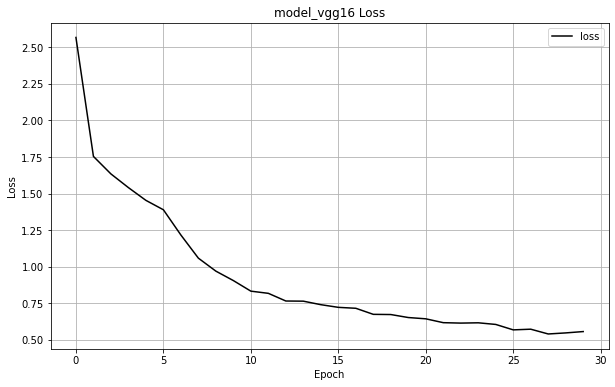

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(history.history['loss'],color='black')
plt.title('model_vgg16 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss'], loc='upper right')
plt.grid()
plt.savefig('modelvgg.png', dpi=480, bbox_inches='tight')
plt.show()

In [ ]:
tf.keras.models.save_model(model_vgg,'model_vgg1.h5')

In [ ]:
model_vgg.save_weights("model_vgg2.h5")

Model-2

In [ ]:
#All Callbacks while training models
tensorboard=tf.keras.callbacks.TensorBoard(log_dir='detection_resnet',write_images=True,histogram_freq=1)
modelchk=tf.keras.callbacks.ModelCheckpoint('east_resnet.h5',save_best_only=True,mode='min',monitor='loss')
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,amsgrad=True),loss=total_Loss())
history_=model.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 30,callbacks=[tensorboard,roplateau,modelchk,early])

Epoch 1/30
100/100 [==============================] - 639s 6s/step - loss: 2.2154
Epoch 2/30
100/100 [==============================] - 416s 4s/step - loss: 1.4700
Epoch 3/30
100/100 [==============================] - 417s 4s/step - loss: 1.3343
Epoch 4/30
100/100 [==============================] - 424s 4s/step - loss: 0.9764
Epoch 5/30
100/100 [==============================] - 410s 4s/step - loss: 0.8104
Epoch 6/30
100/100 [==============================] - 415s 4s/step - loss: 0.6971
Epoch 7/30
100/100 [==============================] - 412s 4s/step - loss: 0.6364
Epoch 8/30
100/100 [==============================] - 412s 4s/step - loss: 0.6320
Epoch 9/30
100/100 [==============================] - 413s 4s/step - loss: 0.5837
Epoch 10/30
100/100 [==============================] - 411s 4s/step - loss: 0.5623
Epoch 11/30
100/100 [==============================] - 410s 4s/step - loss: 0.5187
Epoch 12/30
100/100 [==============================] - 411s 4s/step - loss: 0.4981
Epoch 13/30
1

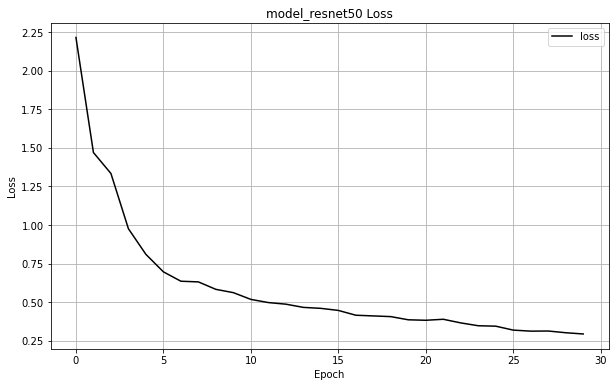

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(history_.history['loss'],color='black')
plt.title('model_resnet50 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss'], loc='upper right')
plt.grid()
plt.savefig('resnet50.png', dpi=480, bbox_inches='tight')
plt.show()

In [ ]:
tf.keras.models.save_model(model,'model_res.h5')

In [ ]:
model.save_weights("model_res1.h5")

## Step-4 Interference Pipeline
#### After training first the geometry map is converted back to the boundary boxes.
#### Then we apply thresholding based on th score map to remove some low confidence boxes.
 #### The remaining boxes are merged using Non-Maximum Supression  

### Non-Maximum Supression
#### locality_aware_nms adds weighted_merge to the standard nms. The so-called weighted_merge is to merge 2 IOUs higher than a certain threshold in the output box based on the score.

### Locality-Aware NMS 
#### 1.First sort the geometries and start from the top most.
#### 2.Take the next box in the row and find the IOU with the previous 
#### 3.If IOU > threshold, merge the 2 boxes by taking the weightage average by score otherwise keep it as it is.
#### 4. Repeat steps 2 to 3 until all boxes are itterated.
#### 5. At last apply standard NMS on the remaining boxes.

<img src="https://i.ibb.co/TKKQkP5/8830976613e667f9612f5db9c49e05f5.jpg" alt="8830976613e667f9612f5db9c49e05f5" border="0">

In [26]:
#These Are Function that will be used while converting geo_maps to score_maps and returns bounding boxes for image after nms

def sort_poly(p):
  min_axis = np.argmin(np.sum(p, axis=1))
  p = p[[min_axis, (min_axis+1)%4, (min_axis+2)%4, (min_axis+3)%4]]
  if abs(p[0, 0] - p[1, 0]) > abs(p[0, 1] - p[1, 1]):
    return p
  else:
    return p[[0, 3, 2, 1]]
def intersection(g, p):
    g = Polygon(g[:8].reshape((4, 2)))
    p = Polygon(p[:8].reshape((4, 2)))
    if not g.is_valid or not p.is_valid:
        return 0
    inter = Polygon(g).intersection(Polygon(p)).area
    union = g.area + p.area - inter
    if union == 0:
        return 0
    else:
        return inter/union


def weighted_merge(g, p):
    g[:8] = (g[8] * g[:8] + p[8] * p[:8])/(g[8] + p[8])
    g[8] = (g[8] + p[8])
    return g


def standard_nms(S, thres):
    order = np.argsort(S[:, 8])[::-1]
    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        ovr = np.array([intersection(S[i], S[t]) for t in order[1:]])

        inds = np.where(ovr <= thres)[0]
        order = order[inds+1]

    return S[keep]


def nms_locality(polys, thres=0.3):
    '''
    :param polys: a N*9 numpy array. first 8 coordinates, then prob
    :return: boxes after nms
    '''
    S = []
    p = None
  
    for g in polys:
        if p is not None and intersection(g, p) > thres:
        
            p = weighted_merge(g, p)
        else:
            if p is not None:
                S.append(p)
            p = g
  
    if p is not None:
        S.append(p)

    if len(S) == 0:
        return np.array([])
    
    return standard_nms(np.array(S), thres)

In [27]:
# Inference pipeline function used for generating predicted bounding boxes on image for text detection
def inferencePipeline(img,model):
  
  start_time=time.time()
  
  #1.Text Detection
  img=cv2.resize(img,(512,512))
  ii=model.predict(np.expand_dims(img,axis=0))
  score_map=ii[0][:,:,0]
  geo_map=ii[0][:,:,1:]
  print("Shape of Score Map",score_map.shape)
  print("Shape of Geo Map",geo_map.shape)

  for ind in [0,1,2,3,4]:
    geo_map[:,:,ind]*=score_map

  #2.ROI Rotate  
  score_map_thresh=0.5
  box_thresh=0.1 
  nms_thres=0.2
  if len(score_map.shape) == 4:
    score_map = score_map[0, :, :, 0]
    geo_map = geo_map[0, :, :, :]

  # filter the score map
  xy_text = np.argwhere(score_map > score_map_thresh)

  # sort the text boxes via the y axis
  xy_text = xy_text[np.argsort(xy_text[:, 0])]

  # restore
  text_box_restored = restore_rectangle(xy_text[:, ::-1], geo_map[xy_text[:, 0], xy_text[:, 1], :]) # N*4*2
  boxes = np.zeros((text_box_restored.shape[0], 9), dtype=np.float32)
  boxes[:, :8] = text_box_restored.reshape((-1, 8))
  boxes[:, 8] = score_map[xy_text[:, 0], xy_text[:, 1]]
  print("Boxes Shape",boxes.shape)
  boxes = nms_locality(boxes.astype(np.float64), nms_thres)

  
  # here we filter some low score boxes by the average score map, this is different from the orginal paper
  for i, box in enumerate(boxes):
    mask = np.zeros_like(score_map, dtype=np.uint8)
    cv2.fillPoly(mask, box[:8].reshape((-1, 4, 2)).astype(np.int32), 1)
    boxes[i, 8] = cv2.mean(score_map, mask)[0]
  
    if i==4:
      break
  if len(boxes)>0:
    boxes = boxes[boxes[:, 8] > box_thresh]
  boxes[:,:8:2] = np.clip(boxes[:,:8:2], 0, 512 - 1)
  boxes[:,1:8:2] = np.clip(boxes[:,1:8:2], 0, 512 - 1)  
  res = []
  result = []
  if len(boxes)>0:

    for box in boxes:
      box_ =  box[:8].reshape((4, 2))
      if np.linalg.norm(box_[0] - box_[1]) < 8 or np.linalg.norm(box_[3]-box_[0]) < 8:
        continue
      result.append(box_)
  res.append(np.array(result, np.float32))   

  box_index = []
  brotateParas = []
  filter_bsharedFeatures = []
  for i in range(len(res)):
    rotateParas = []
    rboxes=res[i]
    txt=[]
    for j, rbox in enumerate(rboxes):
      para = restore_roiRotatePara(rbox)
      if para and min(para[1][2:]) > 8:
        rotateParas.append(para)
        box_index.append((i, j))
    pts=[]   
    
    
    #3. Text Recognition (From boxes given by Text Detection+ROI Rotate) 
    
  if len(rotateParas) > 0:
      
      for num in range(len(rotateParas)):
        text=""
        out=rotateParas[num][0]
        crop=rotateParas[num][1]
        points=np.array([[out[0],out[1]],[out[0]+out[2],out[1]],[out[0]+out[2],out[1]+out[3]],[out[0],out[1]+out[3]]])
        pts.append(points)
    
    # 4. Labeling detected and Recognized Text in Image
    
  for i in range(len(pts)):
      cv2.polylines(img,[pts[i]],isClosed=True,color=(0,255,0),thickness=2)
      #cv2.putText(img,txt[i],(pts[i][0][0],pts[i][0][1]),cv2.FONT_HERSHEY_SIMPLEX,0.8, (0, 255, 0), 3)
  end_time=time.time()
  print("Time Taken By Pipeline="+str(end_time-start_time)+" seconds") 
  return img   


In [28]:
train = pd.read_pickle("df_train.pkl")
test = pd.read_pickle("df_test.pkl")

In [30]:
train.head()

,path_img,path_gt,texts,co-ordinates
0,Data/ICDAR_15/train/img_1.jpg,Data/ICDAR_15/train_gt/gt_img_1.txt,"[genaxis theatre, [06], ###, 6203, carpark, ##...","[[377, 117, 463, 117, 465, 130, 378, 130], [49..."
1,Data/ICDAR_15/train/img_10.jpg,Data/ICDAR_15/train_gt/gt_img_10.txt,"[###, harbourfront, cc22, bua, ###, ###, ###, ...","[[261, 138, 284, 140, 279, 158, 260, 158], [28..."
2,Data/ICDAR_15/train/img_100.jpg,Data/ICDAR_15/train_gt/gt_img_100.txt,"[way, out, ###, line, platform, ###, ###, ###]","[[645, 19, 686, 13, 692, 43, 651, 48], [689, 1..."
3,Data/ICDAR_15/train/img_1000.jpg,Data/ICDAR_15/train_gt/gt_img_1000.txt,"[###, ###, ###, ###]","[[486, 216, 554, 211, 558, 243, 489, 248], [1,..."
4,Data/ICDAR_15/train/img_101.jpg,Data/ICDAR_15/train_gt/gt_img_101.txt,"[care, sticker, for, ###, more, ###, ###, ###,...","[[899, 214, 928, 213, 928, 241, 900, 242], [93..."


In [36]:
df_train['texts'] = train['texts']
df_train['co-ordinates'] = train['co-ordinates']

df_test['texts'] = test['texts']
df_test['co-ordinates'] = test['co-ordinates']

In [38]:
from keras.models import load_model
model_1 = load_model('/content/drive/MyDrive/DeepLearning_Models/EAST/model_vgg1.h5', custom_objects={'total_Loss': total_Loss()})
#model_2 = load_model('east_resnet.h5', custom_objects={'total_Loss': total_Loss()})

In [39]:
def bounding_box(img_array,df_txt,df_co):

  txt=np.array(df_txt)

  v = []
  for i in df_co:
    v.append(list(map(int,i)))

  b=np.array(v)
  (r, c) = b.shape

  for y in range(0, r):
    for x in range(0, c):
      rec_pts = np.array([[b[y,0],b[y,1]],[b[y,2],b[y,3]],[b[y,4],b[y,5]],[b[y,6],b[y,7]]], np.int32) ## taking the co ordinates of rectangle
      #rec_pts = pts.reshape((-1,1,2))
      img = cv2.polylines(img_array,[rec_pts],True,(0,255,255),thickness =2) ## used to draw bounding box on the image
      
      (text_width, text_height) = cv2.getTextSize(txt[y], cv2.FONT_HERSHEY_PLAIN, 1.5, 1)[0] ## taking width and height of the image
      # set the text start position
      text_offset_x = b[y,0] 
      text_offset_y = b[y,1] + 2
      # make the coords of the box with a small padding of two pixels
      box_coords = ((text_offset_x, text_offset_y), (text_offset_x + text_width + 2, text_offset_y - text_height - 2))
      #cv2.rectangle(img, box_coords[0], box_coords[1], (255, 255, 255), cv2.FILLED)
      #cv2.putText(img, txt[y], (text_offset_x, text_offset_y), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 0, 0), 1) ## put the text on the image
  plt.grid(False)      
  plt.imshow(img)

### For Model-1

In [40]:
df_train

,path_img,path_gt,texts,co-ordinates
0,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[genaxis theatre, [06], ###, 6203, carpark, ##...","[[377, 117, 463, 117, 465, 130, 378, 130], [49..."
1,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[###, harbourfront, cc22, bua, ###, ###, ###, ...","[[261, 138, 284, 140, 279, 158, 260, 158], [28..."
2,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[way, out, ###, line, platform, ###, ###, ###]","[[645, 19, 686, 13, 692, 43, 651, 48], [689, 1..."
3,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[###, ###, ###, ###]","[[486, 216, 554, 211, 558, 243, 489, 248], [1,..."
4,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[care, sticker, for, ###, more, ###, ###, ###,...","[[899, 214, 928, 213, 928, 241, 900, 242], [93..."
...,...,...,...,...
995,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[stara, bridal, ###, gowns, promotion!!, ###, ...","[[641, 93, 733, 93, 731, 119, 646, 127], [593,..."
996,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[sales, 20%, ###, ###, ###, ###]","[[285, 228, 369, 250, 352, 277, 278, 257], [27..."
997,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[hom, yoga, ###, ###]","[[501, 319, 599, 308, 602, 341, 506, 354], [50..."
998,/content/drive/MyDrive/DeepLearning_Models/EAS...,/content/drive/MyDrive/DeepLearning_Models/EAS...,"[reebok, ###, camelbak, got, your, ###, ogio, ...","[[793, 221, 847, 248, 846, 273, 787, 252], [67..."


Cause: could not parse the source code of <function <lambda> at 0x7f8d5413f050>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8d5413f050>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8d5413f170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8d5413f170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (256, 9)
Time Taken By Pipeline=51.387126445770264 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (723, 9

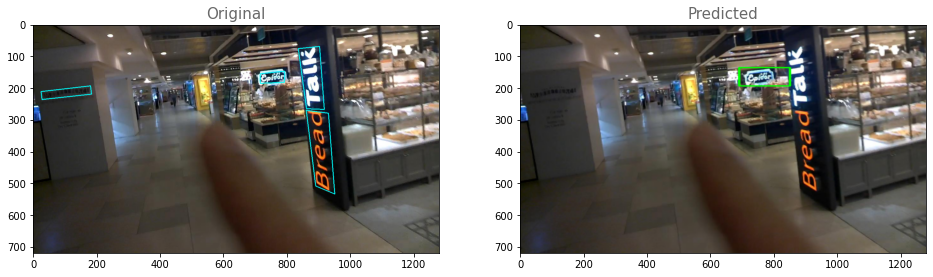

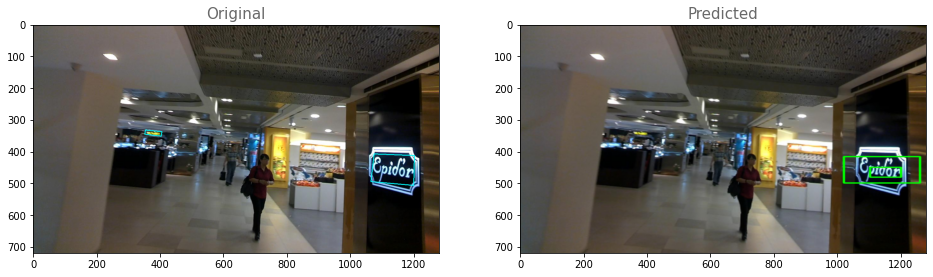

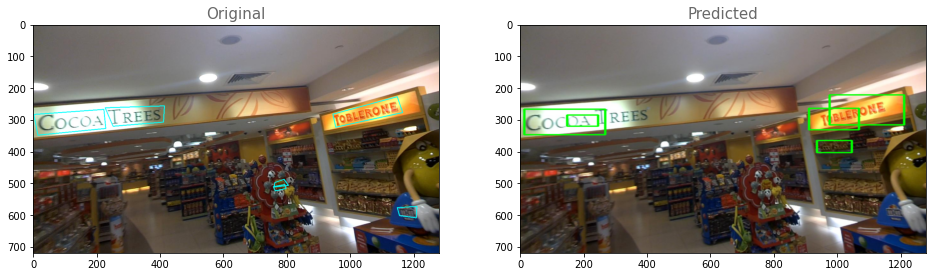

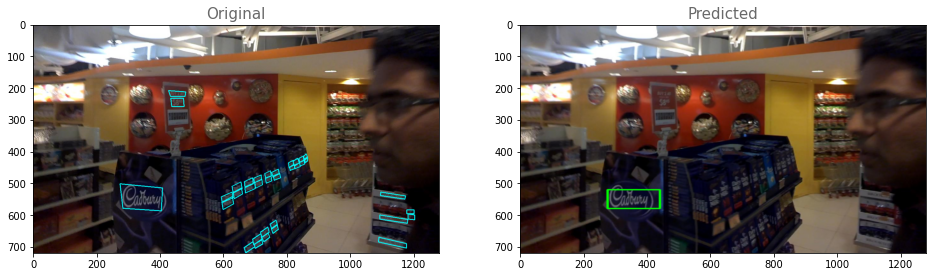

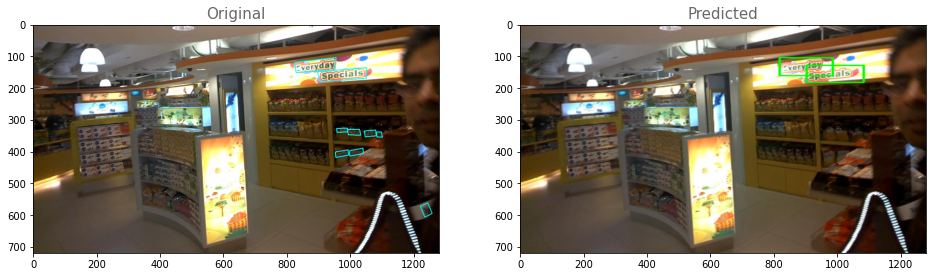

In [41]:
for i in range(90,95):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_p = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]
  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  

  im=inferencePipeline(img,model_1)
  im =cv2.resize(im,(1280,720))
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_p,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.savefig('plot_int'+str(i)+'.png', dpi=300, bbox_inches='tight')


### For Model_2

Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b3b0>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b3b0>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (496, 9)
Time Taken By Pipeline=5.790935277938843 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (558, 9)

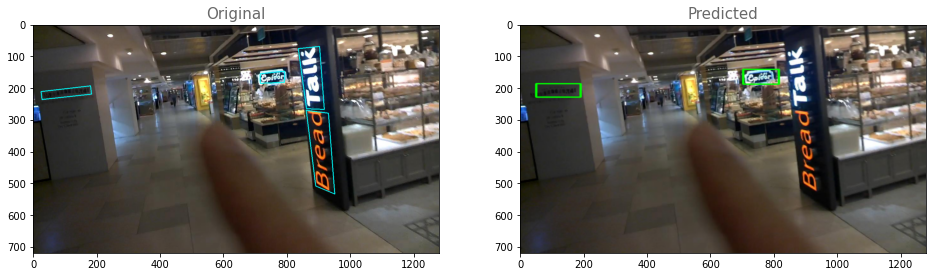

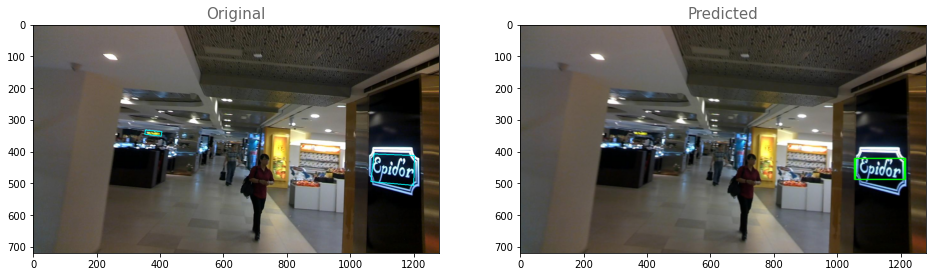

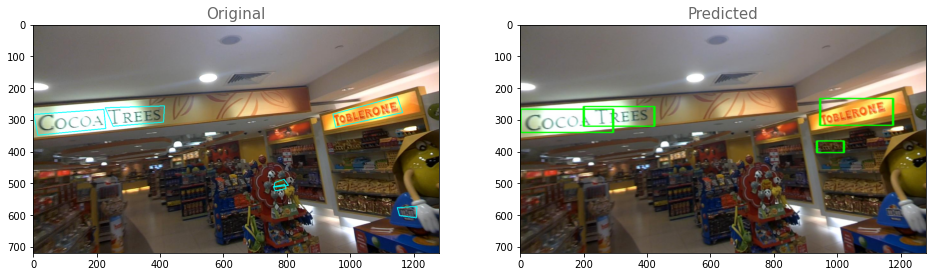

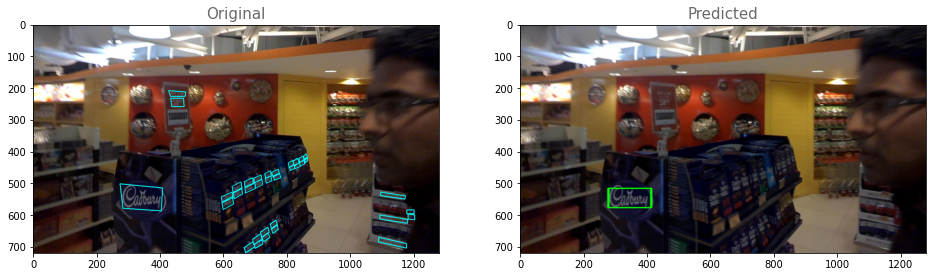

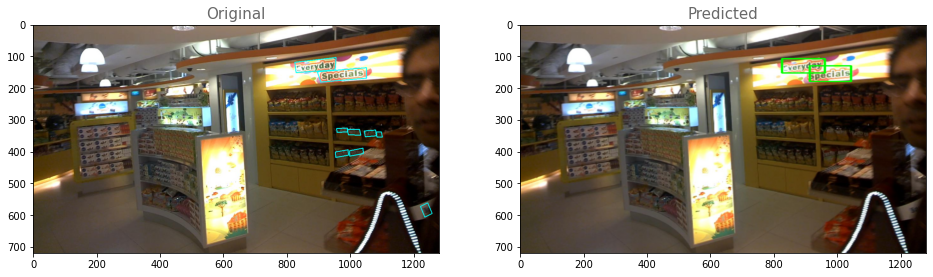

In [ ]:
for i in range(90,95):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_p = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]
  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  

  im=inferencePipeline(img,model_2)
  im =cv2.resize(im,(1280,720))
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_p,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.savefig('plot_int_2'+str(i)+'.png', dpi=300, bbox_inches='tight')


### Final Pipeline[Dtection(EAST) + Recognition(Tesseract)]

In [ ]:
import pytesseract
from spellchecker import SpellChecker
def final(img, model):
  spell = SpellChecker()
  #Configuration setting to convert image to string.  
  configuration = ("-l eng --oem 3 --psm 12")
  img = cv2.imread(filepath) 

  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  #1.Text Detection
  img=cv2.resize(img,(512,512))
  ii=model.predict(np.expand_dims(img,axis=0))
  score_map=ii[0][:,:,0]
  geo_map=ii[0][:,:,1:]
  print("Shape of Score Map",score_map.shape)
  print("Shape of Geo Map",geo_map.shape)

  for ind in [0,1,2,3,4]:
    geo_map[:,:,ind]*=score_map

  #2.ROI Rotate  
  score_map_thresh=0.5
  box_thresh=0.1 
  nms_thres=0.2
  if len(score_map.shape) == 4:
    score_map = score_map[0, :, :, 0]
    geo_map = geo_map[0, :, :, :]

  # filter the score map
  xy_text = np.argwhere(score_map > score_map_thresh)

  # sort the text boxes via the y axis
  xy_text = xy_text[np.argsort(xy_text[:, 0])]

  # restore
  text_box_restored = restore_rectangle(xy_text[:, ::-1], geo_map[xy_text[:, 0], xy_text[:, 1], :]) # N*4*2
  boxes = np.zeros((text_box_restored.shape[0], 9), dtype=np.float32)
  boxes[:, :8] = text_box_restored.reshape((-1, 8))
  boxes[:, 8] = score_map[xy_text[:, 0], xy_text[:, 1]]
  print("Boxes Shape",boxes.shape)
  boxes = nms_locality(boxes.astype(np.float64), nms_thres)


  # here we filter some low score boxes by the average score map, this is different from the orginal paper
  for i, box in enumerate(boxes):
    mask = np.zeros_like(score_map, dtype=np.uint8)
    cv2.fillPoly(mask, box[:8].reshape((-1, 4, 2)).astype(np.int32), 1)
    boxes[i, 8] = cv2.mean(score_map, mask)[0]

    if i==4:
      break
  if len(boxes)>0:
    boxes = boxes[boxes[:, 8] > box_thresh]
  boxes[:,:8:2] = np.clip(boxes[:,:8:2], 0, 512 - 1)
  boxes[:,1:8:2] = np.clip(boxes[:,1:8:2], 0, 512 - 1)  
  res = []
  result = []
  if len(boxes)>0:

    for box in boxes:
      box_ =  box[:8].reshape((4, 2))
      if np.linalg.norm(box_[0] - box_[1]) < 8 or np.linalg.norm(box_[3]-box_[0]) < 8:
        continue
      result.append(box_)
  res.append(np.array(result, np.float32))   

  box_index = []
  brotateParas = []
  filter_bsharedFeatures = []
  for i in range(len(res)):
    rotateParas = []
    rboxes=res[i]
    txt=[]
    for j, rbox in enumerate(rboxes):
      para = restore_roiRotatePara(rbox)
      if para and min(para[1][2:]) > 8:
        rotateParas.append(para)
        box_index.append((i, j))
    pts=[]   
    
    
    #3. Text Recognition (From boxes given by Text Detection+ROI Rotate) 
  txt = [] 
  if len(rotateParas) > 0:
      for num in range(len(rotateParas)):
        text=""
        out=rotateParas[num][0]
        crop=rotateParas[num][1]
        points=np.array([[out[0],out[1]],[out[0]+out[2],out[1]],[out[0]+out[2],out[1]+out[3]],[out[0],out[1]+out[3]]])
        angle=rotateParas[num][2] 
        img1=tf.image.crop_to_bounding_box(img,out[1],out[0],out[3],out[2])
        img2=tf.keras.preprocessing.image.random_rotation(img1,angle)
        img2=tf.image.crop_to_bounding_box(img2,crop[1],crop[0],crop[3],crop[2]).numpy()
        img2=cv2.resize(img2,(128,64))
        img2=cv2.detailEnhance(img2)
        plt.show()
        text = pytesseract.image_to_string(img2, config=configuration).strip()
        strn = spell.correction(text)
        strn = re.sub(r"\n", " ",strn)
        strn = re.sub(r"\t", " ", strn)
        strn = re.sub(r'[?|$|.|!]',r'',strn)
        strn = re.sub(r'[^a-zA-Z0-9 ]',r'',strn)
        txt.append(strn)
  
        pts.append(points)

  for i in range(len(txt)):
    cv2.polylines(img,[pts[i]],isClosed=True,color=(255,255,0),thickness=2)
   # cv2.putText(img,txt[i],(pts[i][0][0],pts[i][0][1]),cv2.FONT_HERSHEY_SIMPLEX,0.8, (0, 0, 255), 3)

  return img,txt


In [ ]:
for i in range(100,105):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_ = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]

  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  im,txt= final(img,model_2)
  print("Actual Texts:",txt_)
  print("Predicted texts:",txt)
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.show()
  print("="*100)
  

### Calculating losses for each images

In [ ]:
data_root

'/content/drive/MyDrive/DeepLearning_Models/EAST/Data'

In [ ]:
def loss(df):
  loss_list = []
  for i in range(len(df)):
    print(i)


    input_size=512
    filepath = df['path_img'][i]
    gt_file = df['path_gt'][i]

    if filepath ==f'{data_root}/Data/train/img_141.jpg' and gt_file == f'{data_root}/Data/train_gt/gt_img_141.txt':
      loss = np.array(0.0)
      loss_list.append(loss)
    else:

      img_p = cv2.imread(filepath) 
      img_p = cv2.resize(img_p,(512,512))
      ii = model.predict(np.expand_dims(img_p,axis=0))
      y_pred_cls = ii[0][:,:,0]
      y_pred_geo = ii[0][:,:,1:]

      im = cv2.imread(filepath,cv2.IMREAD_UNCHANGED)

      # print im_fn
      h, w, _ = im.shape
      # txt_fn = im_fn
      text_polys, text_tags = load_annoataion(gt_file)
      text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))


      #resize the image to input size
      new_h, new_w, _ = im.shape
      resize_h = input_size
      resize_w = input_size
      im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)


      resize_ratio_3_x = resize_w/float(new_w)
      resize_ratio_3_y = resize_h/float(new_h)
      text_polys[:, :, 0] *= resize_ratio_3_x
      text_polys[:, :, 1] *= resize_ratio_3_y
      new_h, new_w, _ = im.shape
      y_true_cls, y_true_geo, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

      dice_loss = dice_coefficient(y_true_cls, y_pred_cls, training_mask)
      # we scale classification loss by factor of 0.01 to match the iou loss part
      dice_loss =0.01*dice_loss

      rbox_loss_ = rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask)

      loss = 100*(rbox_loss_ + dice_loss).numpy()
      loss_list.append(loss)
  return loss_list


In [ ]:
df_train['loss'] = loss(df_train)
df_train.to_pickle('final_train.pkl')

0


NameError: ignored

In [ ]:
df_test['loss'] = loss(df_test)
df_test.to_pickle('final_test.pkl')

0


NameError: ignored

# Conclusion

* From both east_vgg and east_resnet moels ,It can be observed that the total loss is very less for resnet approx. 0.28 which means resnet model  is better detection model.

* For recognition Tesseract is used ,and from the output we can observe that most of time it predicted the text well, but not accurate ,So other recognition models can be used for better performence.